In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import random
import time
%matplotlib inline
import matplotlib.animation as animation
import csv
# matplotlib.style.use('seaborn')

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn import manifold
from sklearn.cluster import AgglomerativeClustering
from sklearn.neighbors import kneighbors_graph
from scipy.cluster import hierarchy
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from wordcloud import WordCloud

from mpl_toolkits.mplot3d import Axes3D

In [2]:
author_data=pd.read_csv("author_data_clusters.csv")
author_data.index=author_data.id
author_data=author_data[["gender","age","topic","sign","grupo_edad","Freq"]]
author_data.sample(20)

,gender,age,topic,sign,grupo_edad,Freq
id,,,,,,
3583112,female,23,indUnk,Gemini,B,49
3590242,male,27,indUnk,Leo,B,2
3315638,male,14,Arts,Sagittarius,A,4
3416334,male,34,indUnk,Pisces,C,2
4089504,male,13,indUnk,Cancer,A,2
3335758,male,14,Student,Taurus,A,10
4233700,female,15,indUnk,Leo,A,4
3394208,male,17,Student,Capricorn,A,125
3933548,male,24,Technology,Leo,B,16


In [3]:
tfidf_data=pd.read_csv("usr_txt_ftr_3.csv",header=0,index_col="id")#_2# This dataframe is already normalized to max val
# tfidf_data.index=author_data.id
# # author_data=author_data[["gender","age","topic","sign","grupo_edad","Freq"]]
tfidf_data.sample(20)

,00,000,10,100,11,12,13,14,15,16,...,ya,yay,yea,yeah,year,years,yes,yesterday,york,young
id,,,,,,,,,,,,,,,,,,,,,
4218084,0.000000,0.000000,0.002973,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.002624,0.000000,0.000000,0.000000,0.00000,0.000000
3549246,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.004199,0.000000,0.000000,0.00000,0.000000
4095716,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
4043764,0.000000,0.000000,0.000782,0.0,0.000898,0.000000,0.000000,0.000000,0.005052,0.000000,...,0.000000,0.005509,0.000000,0.003420,0.002450,0.004170,0.011141,0.004317,0.00266,0.007770
3749504,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.004850,...,0.000000,0.000000,0.005061,0.000000,0.000000,0.003195,0.003418,0.000000,0.00000,0.000000
3463074,0.000000,0.000000,0.003384,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.003071,0.000000,0.000000,0.00000,0.000000
1021779,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.007426,0.018011,0.000000,0.00000,0.002379
3953305,0.006333,0.000000,0.004593,0.0,0.001759,0.017109,0.000000,0.000000,0.001819,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007108,0.00000,0.000000
3954628,0.004497,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000


In [4]:
author_data=author_data.loc[tfidf_data.index,:]# select sample tfidf matrix /// Cuando la matriz viene de una muestra

In [5]:
words_index=np.array(['great', 'though', 'school', 'ever', 'better', 'myself', 'another',
             'let', 'year', 'many', 'since', 'world', 'friends', 'maybe',
             'next', 'thought', 'look', 'few', 'man', 'through', 'bad', 'fun',
             'god', 'someone', 'week', 'actually', 'find', 'im', 'lot', 'sure',
       'days', 'pretty', 'best', 'getting', 'away', 'every', 'years',
       'house', 'may', 'tell', 'came', 'nothing', 'same', 'old',
       'anything', 'read', 'blog', 'stuff', 'doing', 'guess', 'everyone',
       'put', 'place', 'own', 'nice', 'left', 'end', 'friend', 'told',
       'happy', 'big', 'everything', 'does', 'person', 'anyway', 'yeah',
       'give', 'such', 'hope', 'guy', 'until', 'mean', 'ok', 'morning',
       'done', 'enough', 'yes', 'talk', 'call', 'having', 'yet', 'found',
       'times', 'might', 'whole', 'keep', 'started', 'called', 'bit',
       'wanted', 'part', 'movie', 'hard', 'try', 'took', 'once',
       'probably', 'least', 'else', 'post', 'later', 'doesn', 'trying',
       'show', 'cool', 'looking', 'start', '10', 'name', 'help',
       'without', 'kind', 'head', 'must', 'dont', 'mind', 'won',
       'tomorrow', 'course', 'quite', 'both', 'mom', 'each', 'remember',
       'saw', 'lol', 'anyone', 'job', 'use', 'makes', 'play', 'believe',
       'family', 'room', 'finally', 'hours', 'girl', 'already', 'car',
       'yesterday', 'gonna', 'point', 'used', 'live', 'thinking', 'three',
       'hate', 'real', 'weekend', 'game', 'music', 'wasn', 'feeling',
       'says', 'money', 'almost', 'sleep', 'talking', 'far', 'book',
       'guys', 'funny', 'fact', 'decided', 'write', 'care', 'class',
       'seems', 'different', 'stop', 'tonight', 'high', 'together',
       'watch', 'hell', 'able', 'working', 'shit', 'soon', 'felt',
       'asked', 'past', 'leave', 'change', 'face', 'wrong', 'isn',
       'sometimes', 'wait', 'heart', 'making', 'song', 'ask', 'reason',
       'coming', 'story', 'com', 'free', 'haven', 'half', 'reading',
       'cause', 'haha', 'dad', 'wish', 'damn', '30', 'pm', 'bed', 'seen',
       'news', 'ago', 'words', 'during', 'idea', 'between', 'minutes',
       'side', 'phone', 'stupid', 'miss', 'couple', 'lost', 'eyes', 'run',
       'kids', 'party', 'food', 'interesting', 'second', 'hey', 'either',
       'however', 'hour', 'okay', 'knew', 'tired', 'comes', 'sorry',
       'happened', 'hand', 'saying', 'set', 'couldn', 'hear', 'full',
       'goes', 'summer', 'late', 'gone', 'rather', '11', 'eat', 'rest',
       'true', 'please', 'weeks', 'friday', 'others', 'less', 'heard',
       'word', 'watching', 'computer', 'small', 'hair', 'hot',
       'understand', 'under', 'gave', 'along', 'kinda', 'instead',
       'taking', 'fucking', 'playing', 'stay', 'thats', 'looks',
       'parents', 'ass', 'means', 'early', 'against', 'whatever', 'white',
       'looked', 'buy', 'check', 'open', 'writing', 'matter', 'dinner',
       'tried', 'bush', 'site', 'close', 'moment', 'problem', 'wouldn',
       'sad', 'turn', 'top', 'saturday', 'seem', 'water', 'girls',
       'months', 'ya', 'war', 'group', 'gets', 'men', 'walk', 'city',
       'front', 'fuck', 'alone', 'met', 'spent', 'black', 'become', 'boy',
       '12', 'crazy', 'baby', 'happen', 'played', 'move', 'wonder', 'tv',
       'outside', 'knows', 'sunday', 'thanks', 'short', 'living', 'woman',
       'church', 'although', 'line', 'watched', 'number', 'hit',
       'american', 'birthday', 'break', 'thank', 'mother', 'case',
       'weird', '20', 'state', 'behind', 'month', 'inside', 'country',
       'especially', 'women', 'favorite', 'talked', 'anymore', 'lunch',
       'wanna', 'ready', 'sitting', 'self', 'drive', 'door', 'john',
       'wants', 'body', 'office', 'meet', 'list', 'question', 'mr', 'etc',
       'sense', 'turned', 'waiting', 'running', 'cant', 'beautiful',
       'band', 'brother', 'mine', 'often', 'sick', 'la', 'bought',
       'light', 'cuz', 'red', 'sex', 'sit', 'awesome', 'fall', 'pay',
       '15', 'four', 'supposed', 'children', 'sort', 'usually', 'ones',
       'team', 'trip', 'important', 'picture', 'fine', 'anyways',
       'totally', 'deal', 'bring', 'except', 'lots', 'brought', 'test',
       'seeing', 'pain', 'taken', 'monday', 'email', 'yourself', 'spend',
       'sister', 'dream', 'given', 'enjoy', 'pictures', 'cannot', 'lives',
       'type', 'hurt', 'easy', 'sound', 'order', 'college', '2004',
       'town', 'didnt', 'needed', 'books', 'power', 'company', 'online',
       'kept', 'young', 'pick', 'worth', 'five', 'hold', 'de', 'die',
       'completely', 'needs', 'experience', 'sat', 'perhaps', 'movies',
       'using', 'wow', 'death', 'future', 'till', 'chance', 'walked',
       'ended', 'hands', 'middle', 'plan', 'cut', 'woke', 'stand',
       'learn', 'cold', 'note', 'longer', 'across', 'air', 'huge',
       'amazing', 'internet', 'hopefully', 'whether', 'president',
       'thoughts', 'sweet', 'father', 'perfect', 'figure', 'busy', 'film',
       'cute', 'special', 'paper', 'crap', 'problems', 'english', 'bored',
       'dead', 'excited', 'http', 'street', 'forget', 'drink', 'possible',
       'loved', 'listening', 'starting', 'answer', 'several', 'history',
       'finished', 'gay', 'boring', 'road', 'blue', 'page', 'store',
       'www', 'telling', 'walking', 'games', 'apparently', 'wonderful',
       'exactly', 'single', 'realize', 'known', 'system', 'relationship',
       'rock', 'forward', 'law', 'iraq', 'business', 'kid', 'listen',
       'human', 'ha', 'plus', 'fast', 'questions', 'public', 'child',
       'america', 'afternoon', 'due', 'support', 'sounds', 'worked',
       'seriously', 'wrote', 'songs', 'evening', 'age', 'entire', 'dog',
       'gotta', 'date', 'information', 'works', 'den', 'takes', 'himself',
       'visit', 'leaving', 'eating', 'seemed', 'voice', 'sun', 'aren',
       'cd', 'kill', 'happens', 'upon', 'moving', 'mood', 'government',
       'near', 'bar', 'kerry', 'control', 'changed', 'certain', 'ate',
       'current', 'simply', 'mail', 'share', 'dark', 'giving', 'link',
       'yay', 'bus', 'smile', 'driving', 'hehe', 'laugh', 'level',
       'comments', 'within', 'realized', 'personal', '50', 'glad', 'boys',
       'sent', 'service', 'send', 'mad', 'forever', 'written', 'peace',
       'lately', 'truth', 'fight', 'poor', 'meeting', 'dance', 'simple',
       'win', 'definitely', 'study', 'straight', 'cry', 'somewhere',
       'piece', 'article', 'worse', 'add', 'jesus', 'ran', 'teacher',
       'hang', 'message', 'wear', 'green', 'hmm', 'finish', 'sigh',
       'dunno', 'web', 'themselves', 'act', 'space', 'area', 'shall',
       'attention', 'normal', 'fear', 'states', 'pass', 'park', 'strong',
       'situation', 'basically', 'deep', 'recently', 'rain', 'evil',
       'sign', 'ride', 'feels', 'floor', 'eye', 'thursday', 'liked', '00',
       'form', 'learned', 'wake', 'above', 'wife', 'ways', 'usual',
       'random', 'sucks', 'large', 'fire', 'comment', 'feet', 'coffee',
       'art', 'na', 'moved', 'clean', 'speak', 'lose', 'non', 'video',
       'lord', 'strange', 'project', 'catch', 'imagine', 'clothes',
       'feelings', 'website', 'low', 'shopping', 'stopped', 'ah', 'final',
       'conversation', 'somehow', 'major', 'worry', 'table', 'fat',
       'alot', 'choice', 'married', 'picked', 'following', 'july', 'none',
       'missed', 'truly', 'minute', 'serious', 'wearing', 'students',
       'caught', 'bunch', 'complete', 'mention', 'fell', 'blah', 'return',
       'tuesday', 'meant', 'bill', 'based', '000', 'posted', 'christmas',
       'six', 'dreams', 'soul', 'example', 'asking', 'ice', 'clear',
       'suppose', 'worst', 'save', 'itself', 'earlier', 'chris', 'card',
       'step', 'shows', 'wednesday', 'ill', 'issue', 'dun', 'gotten',
       'unless', '100', 'box', 'son', 'view', 'shot', 'blood', 'trust',
       'super', 'afraid', 'weather', 'ppl', 'places', 'towards',
       'beginning', 'continue', 'political', 'general', 'died', 'dear',
       'club', 'mostly', 'update', 'earth', 'yea', 'local', 'lady',
       'bitch', 'third', 'knowing', 'stories', 'speaking', 'national',
       'building', 'beat', 'shirt', 'hello', 'passed', 'including',
       'reality', 'touch', 'season', 'began', 'noticed', 'forgot',
       'beach', '25', 'calls', 'expect', 'window', 'sleeping', 'scared',
       'calling', 'present', 'quickly', 'absolutely', 'apartment',
       'pissed', 'al', 'drunk', 'social', 'wedding', 'star', 'beer', '16',
       'stuck', 'york', 'color', '14', 'round', 'process', 'issues',
       'ten', 'turns', 'brain', 'thinks', 'ur', 'practice', 'program',
       'main', 'style', '40', 'likely', 'action', 'interested', '13',
       'radio', 'lead', 'eventually', 'husband', 'total', 'reasons',
       'weight', 'boyfriend', 'million', 'starts', 'begin', '24', 'paul',
       'character', 'angry', 'managed', 'lucky', 'drinking', 'explain',
       'cat', 'camp', 'hoping', 'broke', 'mouth', 'train', 'currently',
       'everybody', 'broken', 'girlfriend', 'standing', 'stayed', '18',
       'record', 'asleep', 'french', 'mike', 'king', 'ideas', 'period',
       'paid', 'report', 'hi', 'united', 'plans', 'luck', 'faith', 'bye',
       'grade', 'gives', 'david', 'follow', 'headed', 'mark', 'suddenly',
       'nearly', 'slow', 'shoes', 'coz', 'onto', 'choose', 'shouldn',
       'media', 'ground', 'difficult', 'da', 'fit', 'extra', 'alright',
       'trouble', 'subject', 'quick', 'doubt', 'points', 'loves', '2003',
       'entry', 'pool', 'lack', 'cos', 'became', 'michael', 'notice',
       'chicken', 'obviously', 'title', 'putting', 'tears', 'lets',
       'according', 'ive', 'shower', 'ball', 'despite', 'fair', 'june',
       'lazy', 'classes', 'slept', 'daily', 'net', 'hanging', 'certainly',
       'amount', 'energy', 'born', 'folks', 'series', 'named', 'christ',
       'proud', 'shop', 'security', 'decide', 'nobody', 'missing',
       'letter', 'center', 'chinese', 'version', 'names', 'suck',
       'involved', 'marriage', 'album', 'george', 'search', 'filled',
       'blogger', 'wall', 'held', 'student', 'fan', 'likes', 'arms',
       'wondering', 'finding', 'stage', 'eh', 'drove', 'exciting',
       'camera', 'health', 'meaning', 'language', 'sa', 'throw', 'older',
       'society', 'crying', 'admit', 'consider', 'everyday', 'breakfast',
       'bag'])

In [6]:
tfidf_data=tfidf_data.loc[:,tfidf_data.columns.isin(words_index[:500])]#
tfidf_data.shape

(12141, 416)

In [51]:
tfidf_data.to_csv("tfidf_data_auth_416.csv")

In [7]:
# author_data.Freq=author_data.Freq/author_data.Freq.max() # Normalizar frecuencia de publicaciones

In [8]:
# enco_cath=pd.get_dummies(author_data[["gender","grupo_edad"]]).astype("float64")

In [9]:
# enco_cath=enco_cath.loc[:,["gender_female","grupo_edad_A","grupo_edad_B","grupo_edad_C"]]

In [10]:
# author_data_norm=enco_cath.join(author_data.Freq)
# author_data_norm=author_data_norm.join(tfidf_data)

In [11]:
# author_data_norm.sample(20)

## Reducción dimensional

### PCA

In [12]:
pca=PCA()
pca.fit(tfidf_data)
pca_coords=pca.transform(tfidf_data)

416

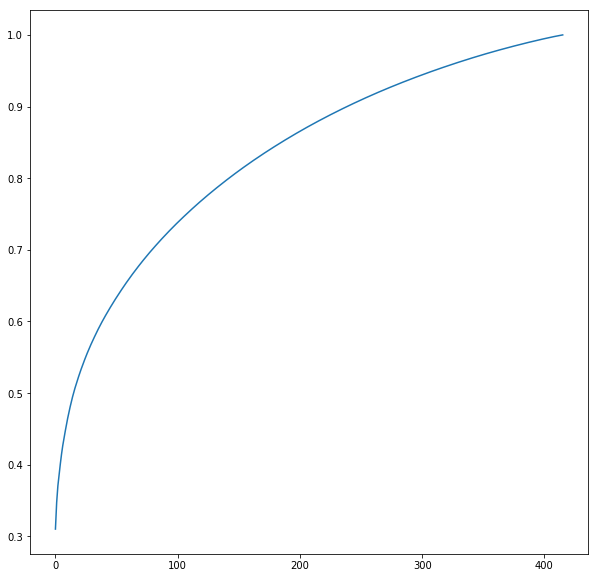

In [13]:
plt.figure(figsize=(10,10))
plt.plot(pca.explained_variance_ratio_.cumsum())
len(pca.explained_variance_ratio_)

In [14]:
comps_pca_var=pd.DataFrame({"var_comp":pca.explained_variance_ratio_,
              "cumsum":pca.explained_variance_ratio_.cumsum()})
comps_pca_var.iloc[[15,39,79,142],:]

,var_comp,cumsum
15,0.006414,0.501110
39,0.003135,0.602214
79,0.001956,0.700036
142,0.001306,0.800049


In [15]:
auth_ward_PCA=hierarchy.linkage(pca_coords[:,:39], 'ward')#tfidf_data

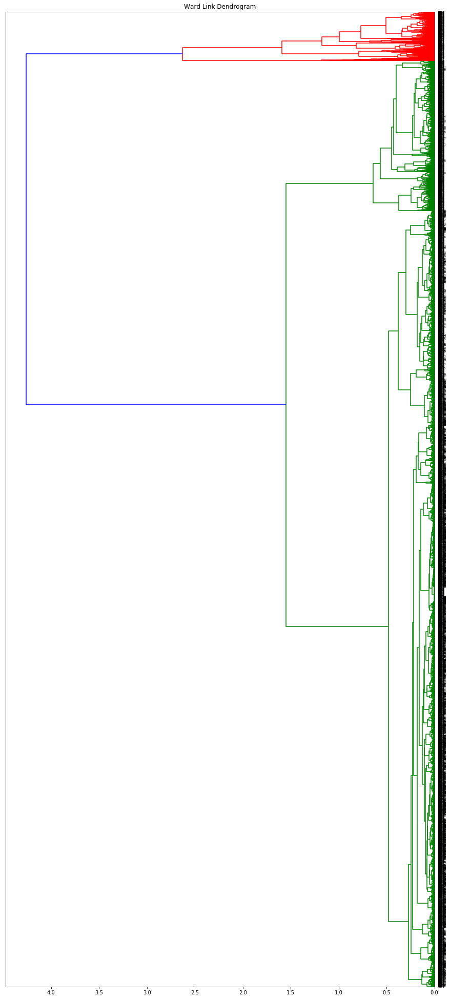

In [16]:
plt.figure(figsize=(15,35))
dn_tf_PCA = hierarchy.dendrogram(auth_ward_PCA,orientation="left")
plt.title('Ward Link Dendrogram')
plt.show()

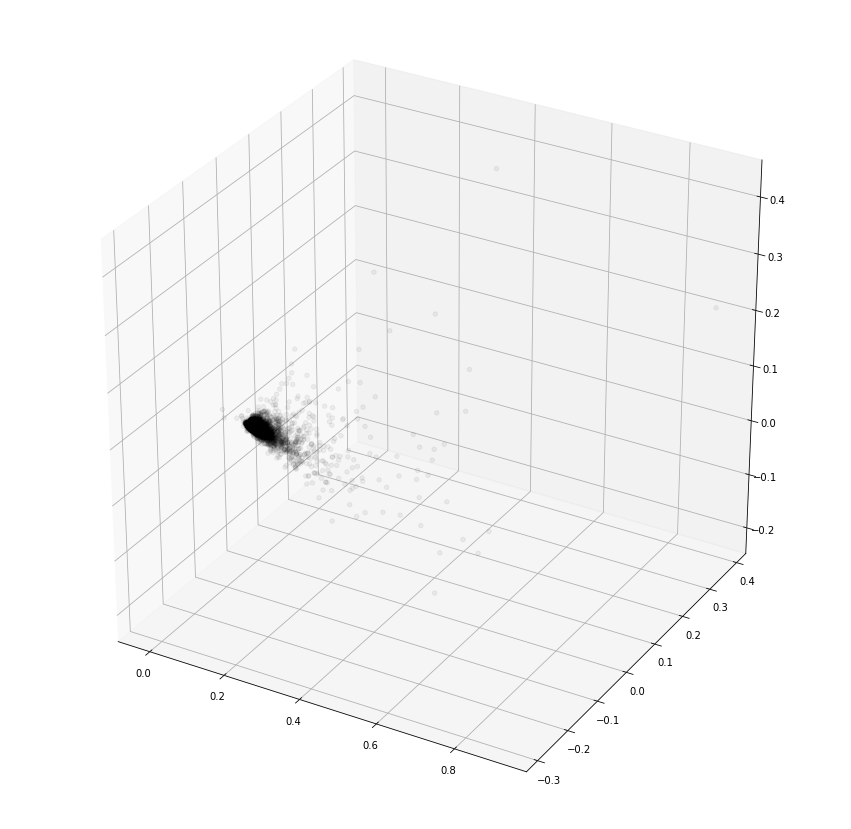

In [17]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=pca_coords[:,0],
           ys=pca_coords[:,1],
           zs=pca_coords[:,2],
           c="black", 
           alpha=.05,
           cmap=plt.cm.Set1)

### Spectral Embedding

In [18]:
# 3d Embedding for visualization
spect_emb_3=manifold.SpectralEmbedding(n_components=15, n_jobs=-1).fit_transform(tfidf_data)#author_data_norm)#

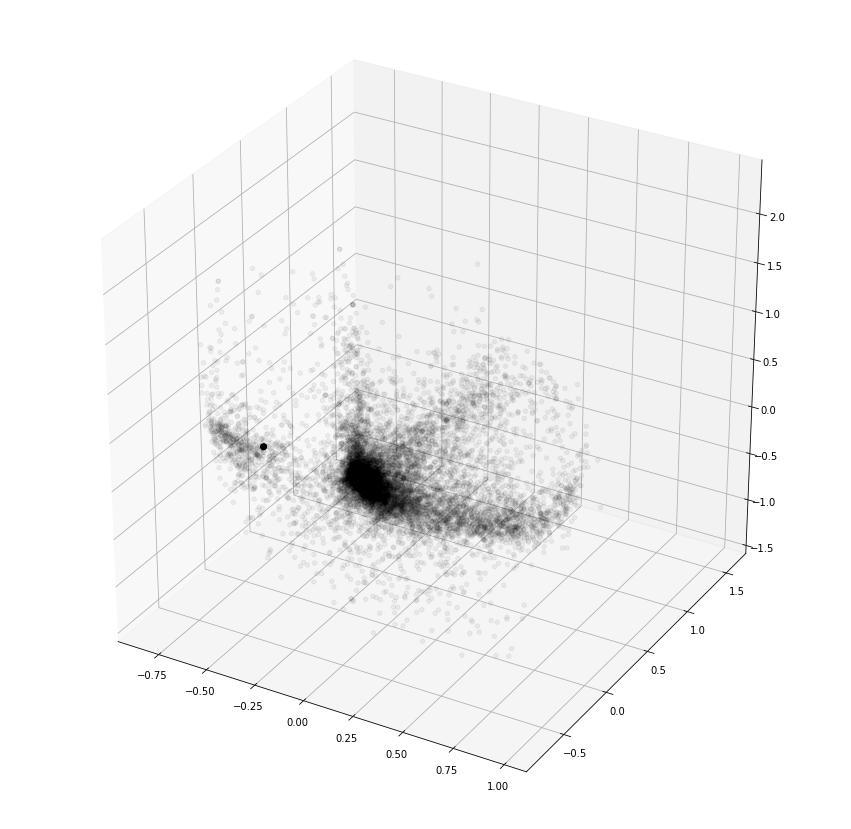

In [19]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_3[:,0],
           ys=spect_emb_3[:,1],
           zs=spect_emb_3[:,2],
           c="black", 
           alpha=.05,
           cmap=plt.cm.Set1)


In [20]:
auth_ward_spect=hierarchy.linkage(spect_emb_3, 'ward')#tfidf_data

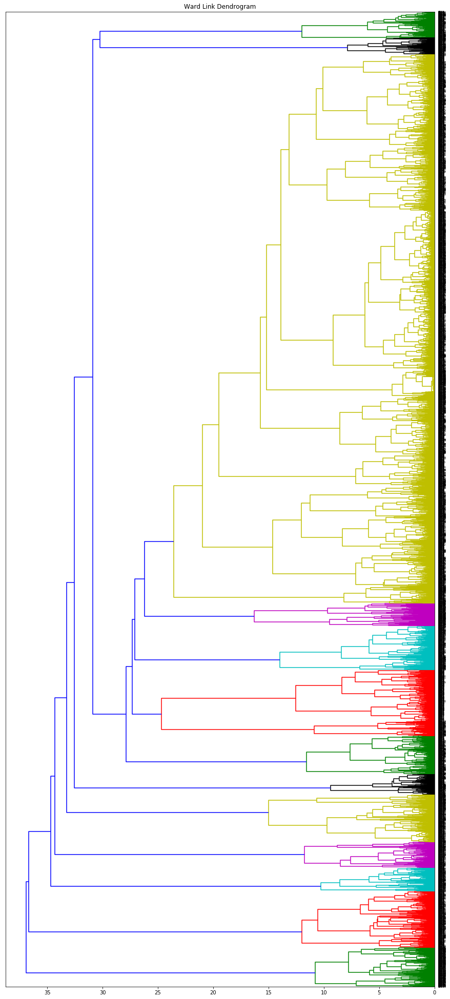

In [21]:
plt.figure(figsize=(15,35))
dn_tf_spect = hierarchy.dendrogram(auth_ward_spect,orientation="left")
plt.title('Ward Link Dendrogram')
plt.show()

#### Conclusiones:

Se define trabajar spectral embedding con 15 dimensiones (tomadas de la varianza explicada del PCA al 50%) y se grafica en las 3 primeras dimensiones del spectral embedding.

# Clustering

In [22]:
connectivity = kneighbors_graph(spect_emb_3, n_neighbors=20, include_self=False)
ward = AgglomerativeClustering(n_clusters=16, connectivity=connectivity,
                               linkage='ward').fit(spect_emb_3)
label = ward.labels_

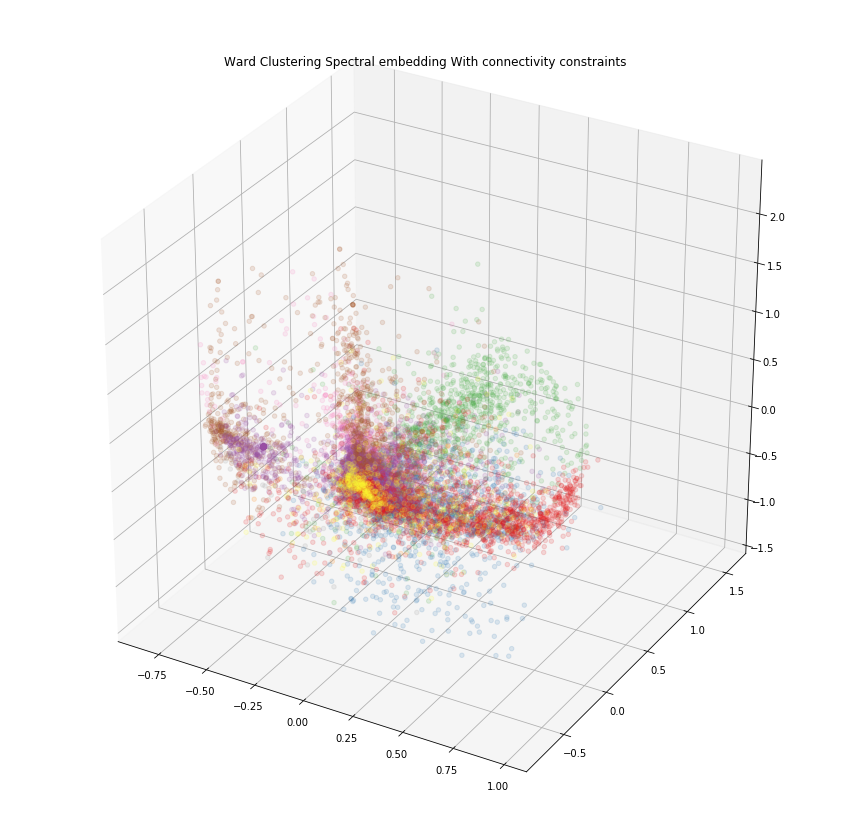

In [23]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for lb in np.unique(label):
    ax.scatter(spect_emb_3[label == lb, 0], 
               spect_emb_3[label == lb, 1], 
               spect_emb_3[label == lb, 2],
               color=plt.cm.Set1(float(lb) / np.max(label + 1)),
               s=20, edgecolor=None, alpha=.15)
plt.title('Ward Clustering Spectral embedding With connectivity constraints')
plt.show()

In [24]:
pd.crosstab(index=label, columns="count")

col_0,count
row_0,
0,1618
1,435
2,1356
3,220
4,782
5,652
6,3819
7,351
8,329


Text(0.5, 1.0, '2d spectral coordinates from 3d spectral hierarchical (ward) clustering')

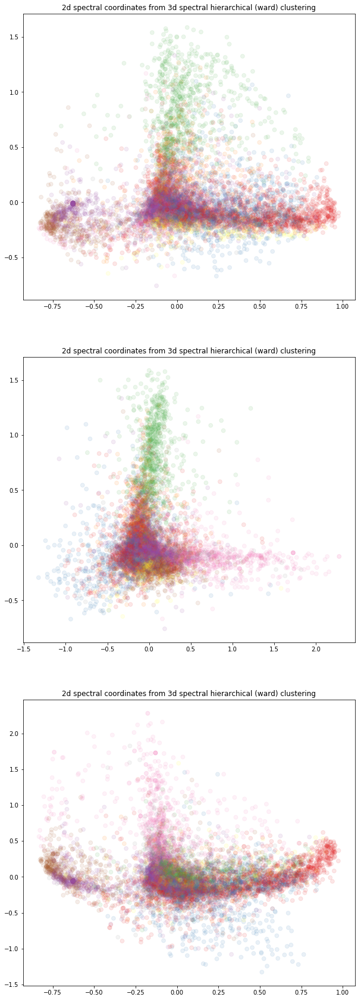

In [25]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_3[:,0],spect_emb_3[:,1], alpha=par_alf,s=45, c=label, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 3d spectral hierarchical (ward) clustering")

plt.subplot(312)
plt.scatter(spect_emb_3[:,2],spect_emb_3[:,1], alpha=par_alf,s=45, c=label, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 3d spectral hierarchical (ward) clustering")

plt.subplot(313)
plt.scatter(spect_emb_3[:,0],spect_emb_3[:,2], alpha=par_alf,s=45, c=label, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 3d spectral hierarchical (ward) clustering")

## DBScan clustering

In [26]:
dist_mat_3d=pairwise_distances(spect_emb_3)

In [27]:
dist_vec=dist_mat_3d.flatten()

C:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


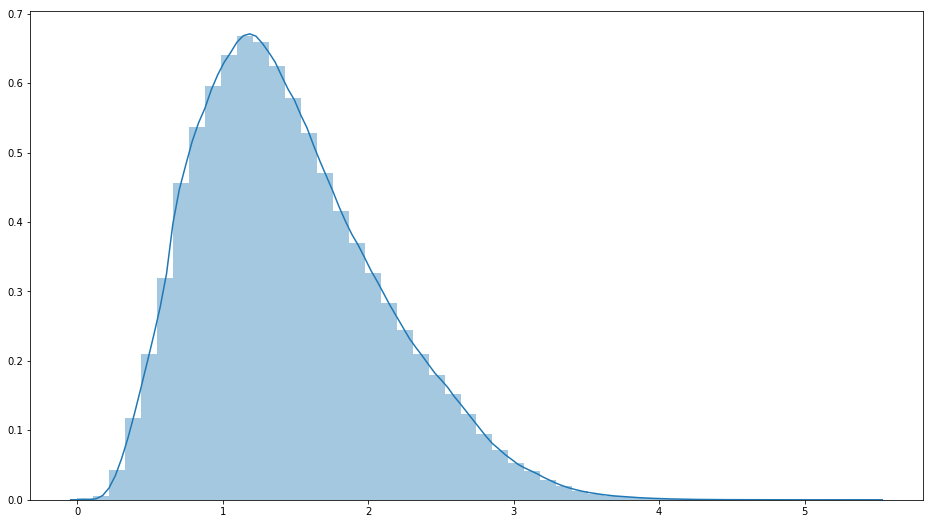

In [28]:
plt.figure(figsize=(16,9))
# plt.hist(n_grams_tfidf_dist_mat.flatten())
sns.distplot(dist_vec)
# sns.kdeplot()

In [29]:
freq_dists=pd.crosstab(index=np.round_(dist_vec[dist_vec<.6],3), columns="count")

col_0  count
row_0       
0.409  20584
0.410  20754
0.411  20224
0.412  20672
0.413  20892
0.414  20930
0.415  21024
0.416  21288
0.417  21216
0.418  21510
0.419  21582
0.420  21738
0.421  21740
0.422  22002
0.423  22216
0.424  22270
0.425  22500
0.426  22322
0.427  22614
0.428  22706
0.429  23032
0.430  23026
0.431  23248
0.432  23444
0.433  23234
0.434  23648
0.435  23544
0.436  23728
0.437  24120
0.438  24156
...      ...
0.479  29254
0.480  29136
0.481  29750
0.482  29194
0.483  29438
0.484  29748
0.485  29848
0.486  30084
0.487  30056
0.488  29836
0.489  30518
0.490  30218
0.491  30752
0.492  30658
0.493  31154
0.494  30942
0.495  30518
0.496  31124
0.497  30704
0.498  31666
0.499  31446
0.500  31860
0.501  32000
0.502  32564
0.503  32106
0.504  32124
0.505  32798
0.506  32444
0.507  32998
0.508  32762

[100 rows x 1 columns]


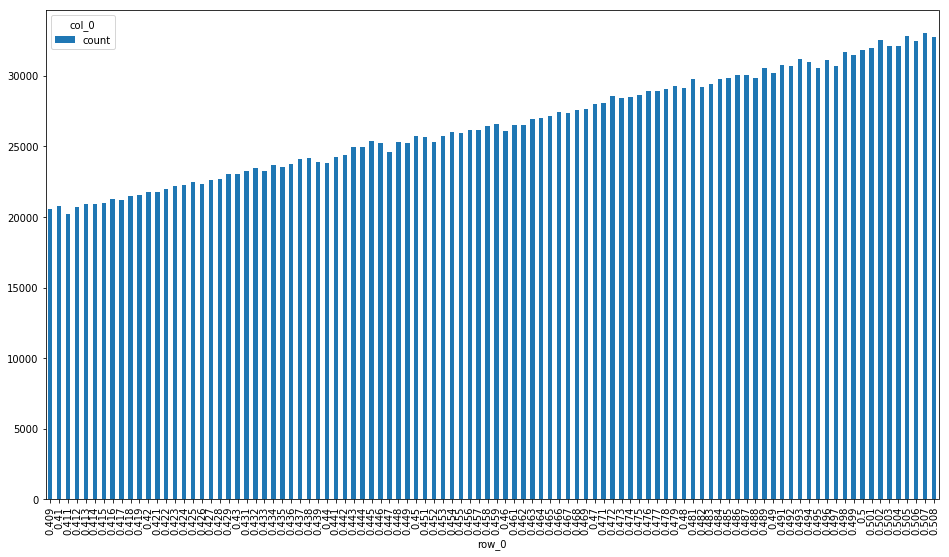

In [30]:
print(freq_dists.iloc[400:500,:])#.iloc[:50,:])
freq_dists.iloc[400:500,:].plot(kind="bar",figsize=(16,9))##.iloc[200:500,:]
#0.168

In [31]:
max_eps=.475
min_eps=.45
eps_par=min_eps+((max_eps-min_eps)/2)
print(eps_par)

0.4625


In [32]:
db_scan = DBSCAN(eps=eps_par, min_samples=70).fit(spect_emb_3)#spect_emb_tfidf)
spect_db_labels = db_scan.labels_

In [33]:
pd.crosstab(index=spect_db_labels, columns="count")

col_0,count
row_0,
-1,5932
0,5802
1,407


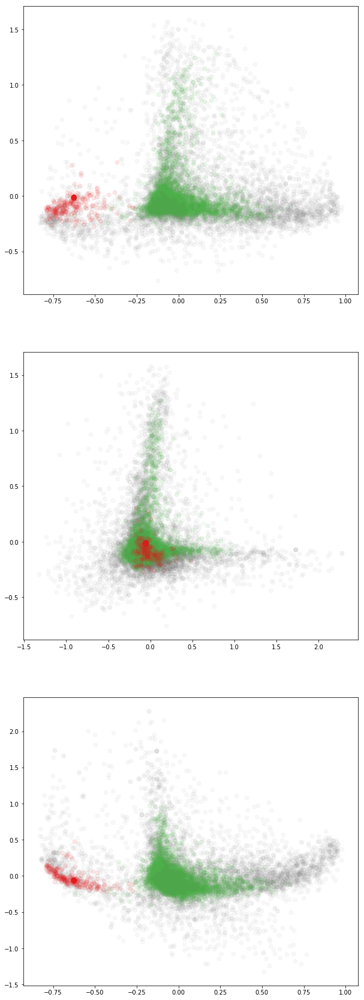

In [34]:
plt.figure(figsize=(10,30))
par_alf=.01#(spect_db_labels>-.5)*.1#0.1
plt.title("2d spectral coordinates from 3d spectral hierarchical (ward) clustering")

plt.subplot(311)
plt.scatter(spect_emb_3[spect_db_labels==-1,0],spect_emb_3[spect_db_labels==-1,1], alpha=0.05,s=45, c="gray", cmap=plt.cm.Set1)
plt.scatter(spect_emb_3[spect_db_labels==0,0],spect_emb_3[spect_db_labels==0,1], alpha=.1,s=45, c="#4daf4a", cmap=plt.cm.Set1)
plt.scatter(spect_emb_3[spect_db_labels==1,0],spect_emb_3[spect_db_labels==1,1], alpha=.1,s=45, c="#e41a1c", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==2,0],spect_emb_3[spect_db_labels==2,1], alpha=.1,s=45, c="#377eb8", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==3,0],spect_emb_3[spect_db_labels==3,1], alpha=.1,s=45, c="#984ea3", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==4,0],spect_emb_3[spect_db_labels==4,1], alpha=.1,s=45, c="#ff7f00", cmap=plt.cm.Set1)

plt.subplot(312)
plt.scatter(spect_emb_3[spect_db_labels==-1,2],spect_emb_3[spect_db_labels==-1,1], alpha=0.05,s=45, c="gray", cmap=plt.cm.Set1)
plt.scatter(spect_emb_3[spect_db_labels==0,2],spect_emb_3[spect_db_labels==0,1], alpha=.1,s=45, c="#4daf4a", cmap=plt.cm.Set1)
plt.scatter(spect_emb_3[spect_db_labels==1,2],spect_emb_3[spect_db_labels==1,1], alpha=.1,s=45, c="#e41a1c", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==2,2],spect_emb_3[spect_db_labels==2,1], alpha=.1,s=45, c="#377eb8", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==3,2],spect_emb_3[spect_db_labels==3,1], alpha=.1,s=45, c="#984ea3", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==4,2],spect_emb_3[spect_db_labels==4,1], alpha=.1,s=45, c="#ff7f00", cmap=plt.cm.Set1)

plt.subplot(313)
plt.scatter(spect_emb_3[spect_db_labels==-1,0],spect_emb_3[spect_db_labels==-1,2], alpha=0.05,s=45, c="gray", cmap=plt.cm.Set1)
plt.scatter(spect_emb_3[spect_db_labels==0,0],spect_emb_3[spect_db_labels==0,2], alpha=.1,s=45, c="#4daf4a", cmap=plt.cm.Set1)
plt.scatter(spect_emb_3[spect_db_labels==1,0],spect_emb_3[spect_db_labels==1,2], alpha=.1,s=45, c="#e41a1c", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==2,0],spect_emb_3[spect_db_labels==2,2], alpha=.1,s=45, c="#377eb8", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==3,0],spect_emb_3[spect_db_labels==3,2], alpha=.1,s=45, c="#984ea3", cmap=plt.cm.Set1)
# plt.scatter(spect_emb_3[spect_db_labels==4,0],spect_emb_3[spect_db_labels==4,2], alpha=.1,s=45, c="#ff7f00", cmap=plt.cm.Set1)


# Animate - Export 3d clusters

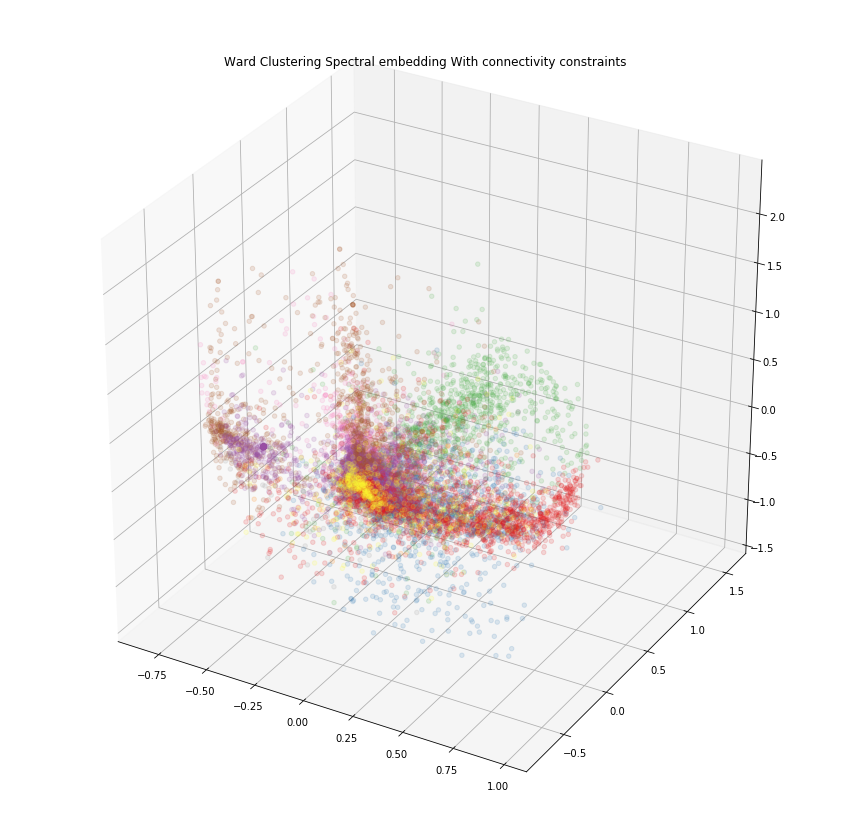

Making animation
Saving Movie File


MovieWriter imagemagick unavailable. Trying to use pillow instead.


Saving animated GIF File


In [35]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=15, metadata=dict(artist='Me'), bitrate=1800)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for lb in np.unique(label):
    ax.scatter(spect_emb_3[label == lb, 0], 
               spect_emb_3[label == lb, 1], 
               spect_emb_3[label == lb, 2],
               color=plt.cm.Set1(float(lb) / np.max(label + 1)),
               s=20, edgecolor=None, alpha=.15)
plt.title('Ward Clustering Spectral embedding With connectivity constraints')
plt.show()
# plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

# print("Making animation")
# rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
# print("Saving Movie File")
# rot_animation.save('cluster_anim_3.mp4', writer=writer)
# print("Saving animated GIF File")
# rot_animation.save('whljgr_clustering_3.gif', dpi=80, writer='imagemagick')

In [36]:
author_data["cluster"]=label
author_data["embd_x_coord"]=spect_emb_3[:,0]
author_data["embd_y_coord"]=spect_emb_3[:,1]
author_data["embd_z_coord"]=spect_emb_3[:,2]

In [37]:
author_data.head(30)

,gender,age,topic,sign,grupo_edad,Freq,cluster,embd_x_coord,embd_y_coord,embd_z_coord
id,,,,,,,,,,
665500,male,35,indUnk,Aries,C,789,0,0.906059,-0.011126,0.347651
1690553,male,17,Student,Scorpio,A,177,5,0.279991,-0.114155,0.617736
2191528,female,14,Arts,Cancer,A,66,7,0.385149,0.242724,-0.185760
993945,female,25,HumanResources,Leo,B,228,0,0.868174,-0.224619,0.257496
3931639,female,33,indUnk,Aries,C,135,2,0.413607,-0.106344,-0.102669
3607330,male,39,indUnk,Leo,C,41,9,0.008969,-0.180386,-0.111946
3749504,female,17,Student,Pisces,A,45,6,-0.036504,-0.102576,0.089531
1769576,male,26,Arts,Aquarius,B,191,0,0.852317,-0.221458,0.357407
2059313,male,26,Student,Leo,B,400,0,0.698726,-0.154970,0.176550


In [38]:
author_data.to_csv("author_data_clusters_2.csv")

# Explore Clusters

In [39]:
pd.crosstab(index=author_data.topic, columns=author_data.cluster)

cluster,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
topic,,,,,,,,,,,,,,,,
Accounting,11,1,11,2,4,1,21,0,0,0,5,2,5,1,1,2
Advertising,19,1,8,1,1,2,31,1,1,4,6,0,1,2,1,2
Agriculture,3,0,4,0,5,0,9,1,0,1,1,0,1,0,0,0
Architecture,3,2,4,0,2,5,23,0,1,0,1,1,1,2,1,0
Arts,82,12,41,11,27,9,164,11,7,19,23,13,19,5,11,12
Automotive,6,0,3,0,2,0,8,0,1,3,0,1,1,0,1,1
Banking,7,2,11,0,1,4,25,0,2,7,5,2,3,3,2,0
Biotech,2,0,4,1,2,3,13,0,0,0,0,1,3,0,1,1
BusinessServices,15,2,15,2,4,2,29,2,3,4,3,5,2,3,0,1


In [40]:
pd.crosstab(index=author_data.grupo_edad, columns=author_data.cluster)

cluster,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
grupo_edad,,,,,,,,,,,,,,,,
A,472,374,404,81,640,397,1454,285,120,80,144,164,208,61,123,90
B,867,57,709,90,136,200,1742,48,166,231,219,140,266,97,120,136
C,279,4,243,49,6,55,623,18,43,154,63,48,76,58,48,53


In [41]:
pd.crosstab(index=[author_data.topic,author_data.grupo_edad], columns=author_data.cluster)

cluster                         0    1    2   3    4    5    6    7   8   9   \
topic              grupo_edad                                                  
Accounting         A             2    0    1   0    1    0    2    0   0   0   
                   B             5    1    9   2    3    1   14    0   0   0   
                   C             4    0    1   0    0    0    5    0   0   0   
Advertising        A             0    0    0   0    0    1    0    0   0   1   
                   B            15    1    4   1    1    1   25    1   1   2   
                   C             4    0    4   0    0    0    6    0   0   1   
Agriculture        A             0    0    1   0    4    0    5    0   0   0   
                   B             3    0    3   0    1    0    2    0   0   1   
                   C             0    0    0   0    0    0    2    1   0   0   
Architecture       A             0    0    0   0    1    0    3    0   1   0   
                   B             3    2    3   0    1    2   16    0   0   0   
                   C             0    0    1   0    0    3    4    0   0   0   
Arts               A            16    7    4   3   20    6   41    9   0   0   
                   B            46    5   24   5    7    2   88    2   7   8   
                   C            20    0   13   3    0    1   35    0   0  11   
Automotive         A             1    0    0   0    1    0    3    0   1   1   
                   B             2    0    3   0    1    0    3    0   0   0   
                   C             3    0    0   0    0    0    2    0   0   2   
Banking            A             0    0    0   0    0    0    1    0   0   0   
                   B             7    2   11   0    1    3   16    0   2   5   
                   C             0    0    0   0    0    1    8    0   0   2   
Biotech            A             0    0    1   1    2    2    4    0   0   0   
                   B             1    0    1   0    0    1    7    0   0   0   
                   C             1    0    2   0    0    0    2    0   0   0   
BusinessServices   A             1    1    1   0    3    0    3    1   0   1   
                   B            13    1   12   2    1    2   18    0   3   1   
                   C             1    0    2   0    0    0    8    1   0   2   
Chemicals          A             1    0    3   0    5    1    4    1   3   0   
                   B             4    0    3   0    2    0    6    0   1   0   
                   C             0    0    0   0    0    0    0    0   0   0   
...                            ...  ...  ...  ..  ...  ...  ...  ...  ..  ..   
RealEstate         A             2    0    0   0    0    0    1    1   0   0   
                   B             1    1    3   1    1    0    5    0   0   1   
                   C             1    0    0   0    0    0    3    0   0   2   
Religion           A             2    0    2   0    2    2    4    0   0   0   
                   B             6    0    4   0    0    2   13    1   1   2   
                   C             2    0    4   0    0    1    6    0   0   2   
Science            A             2    2    2   0    0    1    5    0   1   1   
                   B            14    1   12   1    2    4   26    1   2   4   
                   C             2    0    3   0    0    0    4    0   0   0   
Sports-Recreation  A             0    5    4   0    6    2    6    1   1   0   
                   B             4    0    4   0    0    0    6    1   3   3   
                   C             1    0    0   0    0    0    2    0   1   0   
Student            A           240  199  209  42  288  214  731  143  66  43   
                   B           113    6   76   7   16   29  183    3  20  23   
                   C             2    0    3   1    0    2   15    0   0   2   
Technology         A             2    1    4   0    5    2   17    3   1   0   
                   B            42    6   49   4   11    9  159    3  19  20   


In [42]:
centroides_median=np.array([[np.median(author_data.loc[author_data.cluster==clst,"embd_x_coord"]),
                             np.median(author_data.loc[author_data.cluster==clst,"embd_y_coord"]),
                             np.median(author_data.loc[author_data.cluster==clst,"embd_z_coord"])]
 for clst in list(set(author_data.cluster))])

In [43]:
enumerate(list(set(author_data.cluster)))

Text(0.5, 0.92, "Ward's hierarchical clustering from spectral embedding")

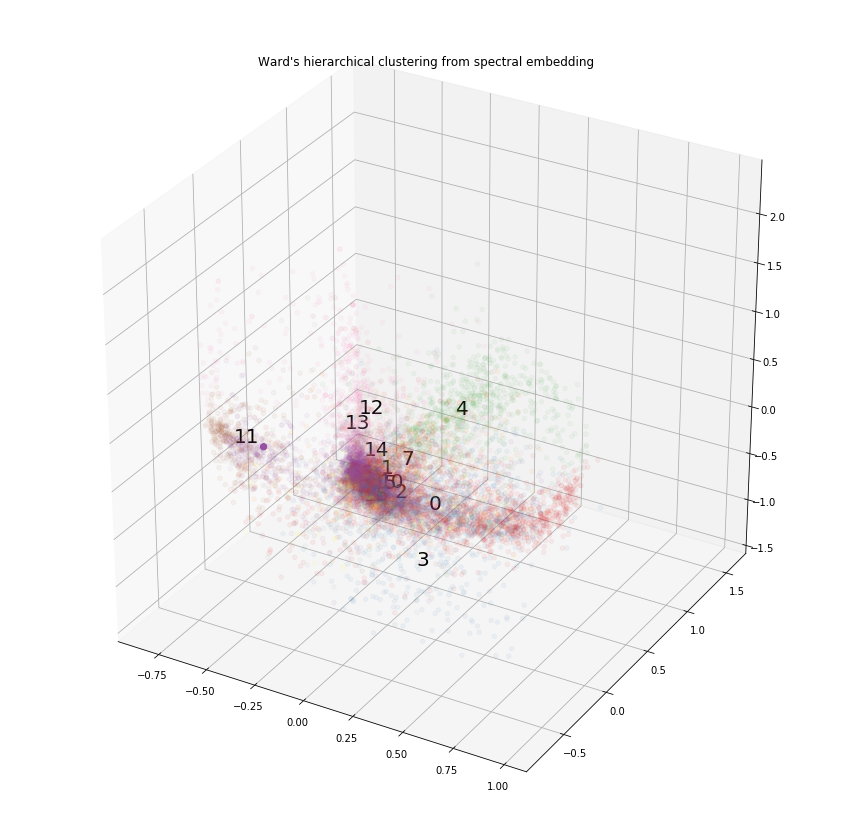

In [44]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_3[:,0],
           ys=spect_emb_3[:,1],
           zs=spect_emb_3[:,2],
           c=label, 
           alpha=0.05,
           cmap=plt.cm.Set1)

# ax.scatter(xs=centroides_median[:,0],
#            ys=centroides_median[:,1],
#            zs=centroides_median[:,2], 
#            s=500)

for i, txt in enumerate(list(set(author_data.cluster))):
    ax.text(centroides_median[i,0],
            centroides_median[i,1],
            centroides_median[i,2],
            '%s' % (str(txt)), size=20, zorder=1, color='k')

plt.title("Ward's hierarchical clustering from spectral embedding" )

# Wordclouds

In [45]:
# tfidf_data=pd.read_csv("tfidf_data_auth_416.csv",header=0,index_col="id")#("usr_txt_ftr_3.csv",header=0,index_col="id")
# del tfidf_data['Unnamed: 0']
tfidf_data.sample(20)
tfidf_data.shape

(12141, 416)

In [46]:
author_tfidf=tfidf_data#pd.read_csv("usr_txt_ftr_3.csv",header=0,index_col="id")
# del author_tfidf['don']
# del author_tfidf['just']
print(author_tfidf.shape)
author_tfidf.sample(20)

(12141, 416)


,10,11,12,15,20,2004,30,able,actually,ago,...,write,writing,wrong,ya,yeah,year,years,yes,yesterday,young
id,,,,,,,,,,,,,,,,,,,,,
3314062,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3636119,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.018152,0.000000,0.000000,0.000000,0.000000,0.000000
4183570,0.001722,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.001805,...,0.000000,0.000000,0.001802,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3071102,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.002843,0.003411,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.009122,0.000000,0.000000,0.000000,0.000000
3360464,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.004027,0.003295,0.000000,0.000000,0.000000,0.000000,0.000000
3722636,0.002698,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3822232,0.004906,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.001358,0.004838,0.000000,...,0.000000,0.000000,0.001405,0.012515,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
782203,0.007606,0.000000,0.001690,0.003823,0.000000,0.00000,0.004829,0.010742,0.019352,0.015929,...,0.001876,0.000000,0.009142,0.045584,0.059721,0.026351,0.002053,0.017964,0.045695,0.000000
3772005,0.005294,0.004970,0.002401,0.003711,0.012254,0.00259,0.002896,0.006586,0.006624,0.003969,...,0.004576,0.005133,0.005953,0.003388,0.006158,0.007098,0.009555,0.008043,0.008863,0.006289


In [47]:
# author_data=pd.read_csv("author_data_clusters_2.csv",header=0,index_col="id")
# print(author_data.shape)
author_data.sample(20)

,gender,age,topic,sign,grupo_edad,Freq,cluster,embd_x_coord,embd_y_coord,embd_z_coord
id,,,,,,,,,,
3578011,male,16,Student,Libra,A,10,6,0.006554,-0.089842,0.009077
3689246,female,24,indUnk,Pisces,B,79,10,-0.007303,-0.111122,-0.167803
3404393,male,26,Student,Scorpio,B,15,0,-0.016921,-0.100170,-0.097101
3427781,female,15,Student,Scorpio,A,71,1,0.238140,0.386451,0.046836
3950765,female,16,indUnk,Aries,A,77,6,-0.048235,-0.004309,-0.142891
1240631,male,41,Communications-Media,Libra,C,14,11,-0.682751,-0.092281,-0.028840
3637580,female,15,Student,Aries,A,23,1,0.002857,0.191075,-0.153655
3698513,female,16,indUnk,Virgo,A,19,2,-0.011228,0.285355,-0.072285
3902340,male,35,Communications-Media,Leo,C,26,2,0.037767,-0.130440,0.110663


In [48]:
clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [#'#a50026',
                                                                     '#d73027',
                                                                     '#f46d43',
                                                                     '#fdae61',
#                                                                      '#fee090',
#                                                                      '#ffffbf',
#                                                                      '#e0f3f8',
#                                                                      '#abd9e9',
                                                                     '#74add1',
                                                                     '#4575b4',
                                                                     '#313695'])

In [49]:
pic_wide=900
def wrd_cld_dic_clust(clust_labels,clust_id,top_n=300):
    txt_freqs= author_tfidf[clust_labels==clust_id].sum(axis=0)
    indices = np.argsort(txt_freqs)[::-1]
    features =list(author_tfidf.columns)
    top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
    fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
    wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#Dark2_r)#Paired_r)#tab10_r)#Set1_r) #
    wc.generate_from_frequencies(fr_dic)
    return wc

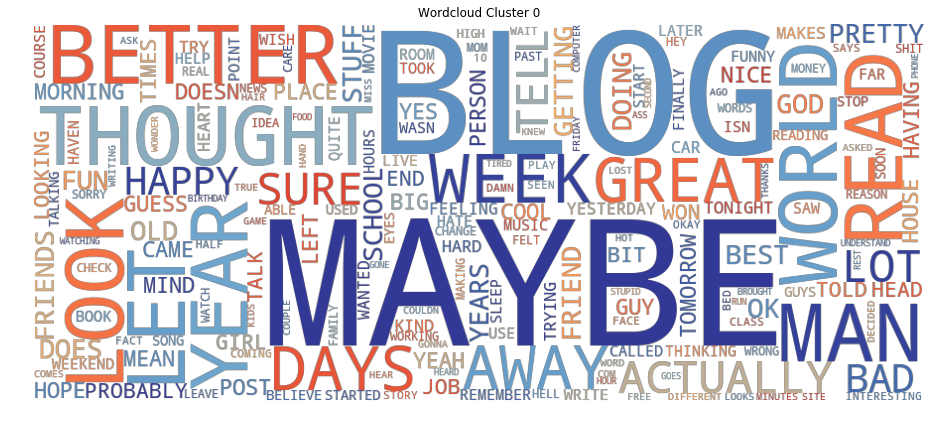

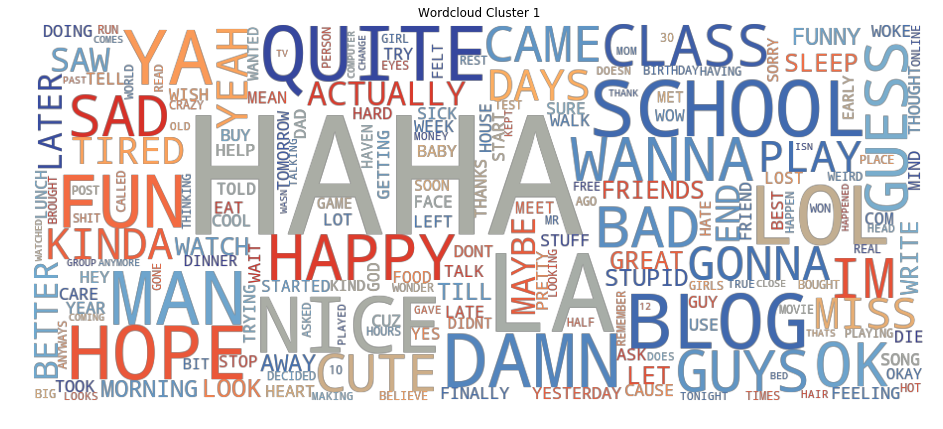

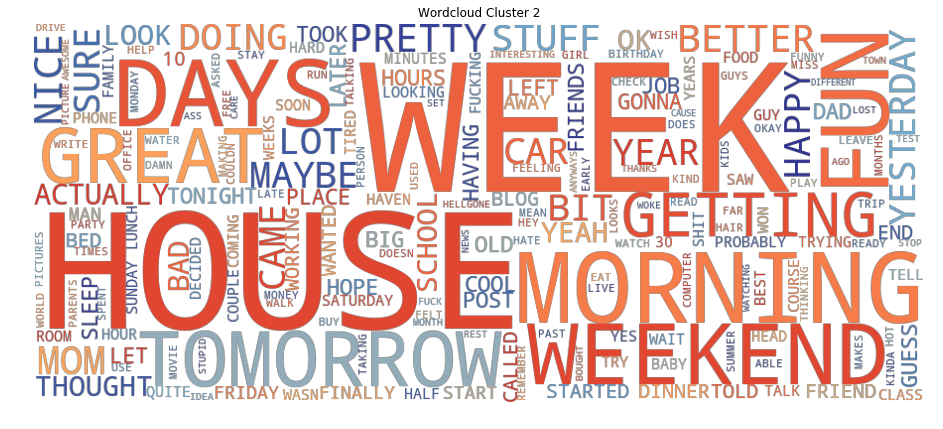

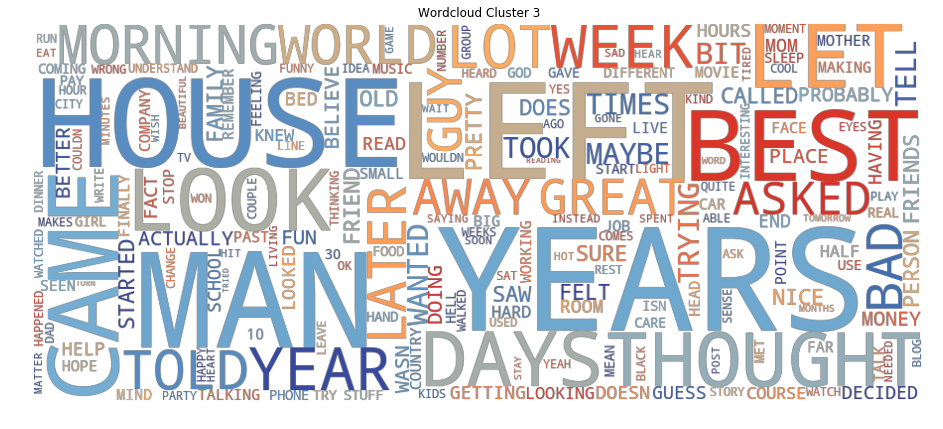

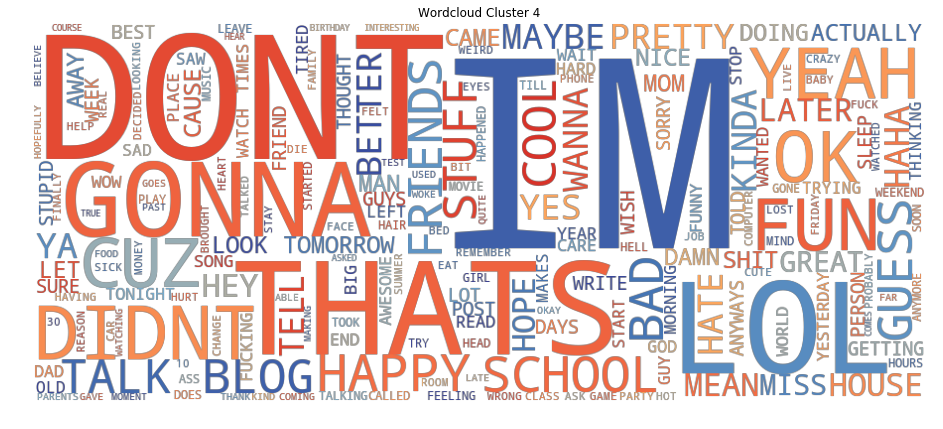

...

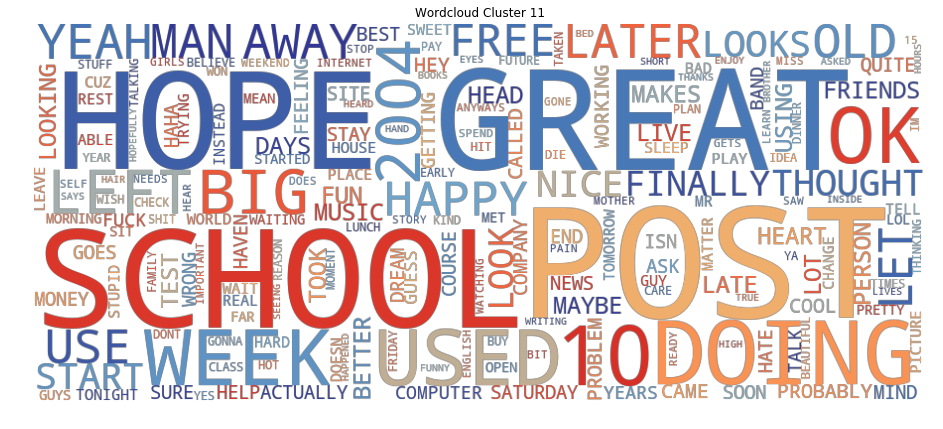

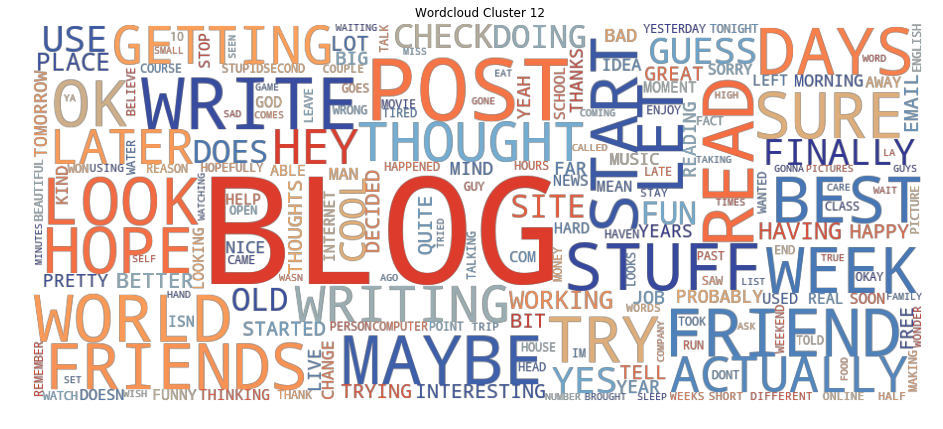

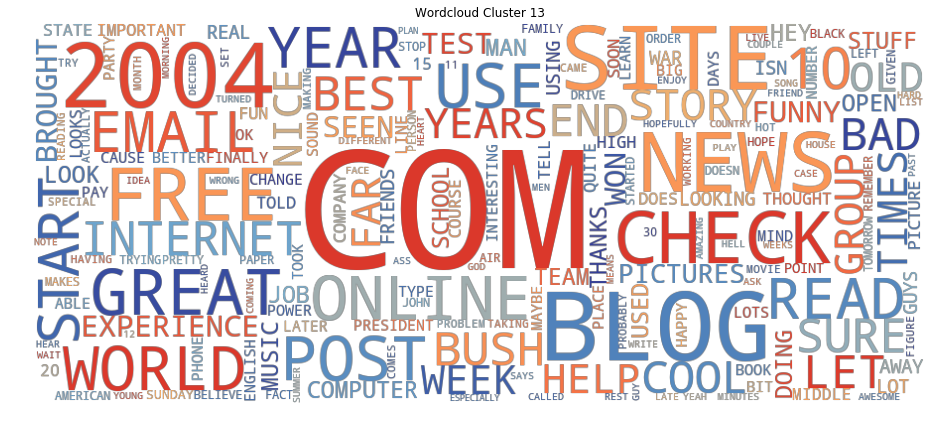

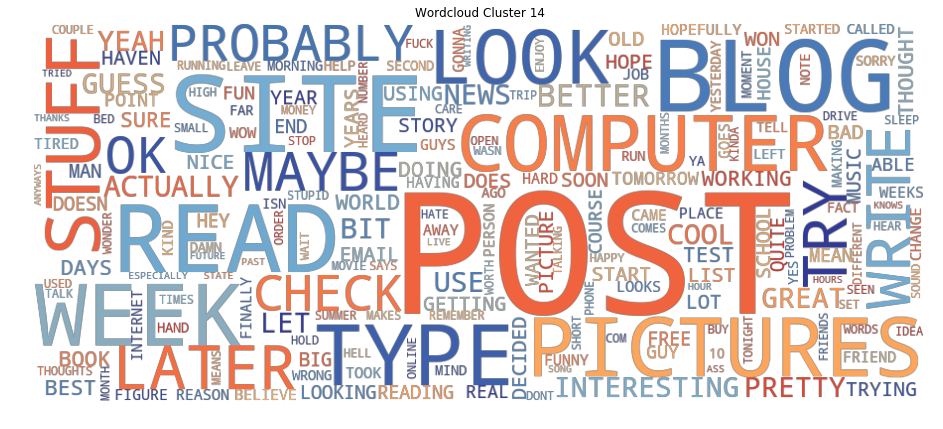

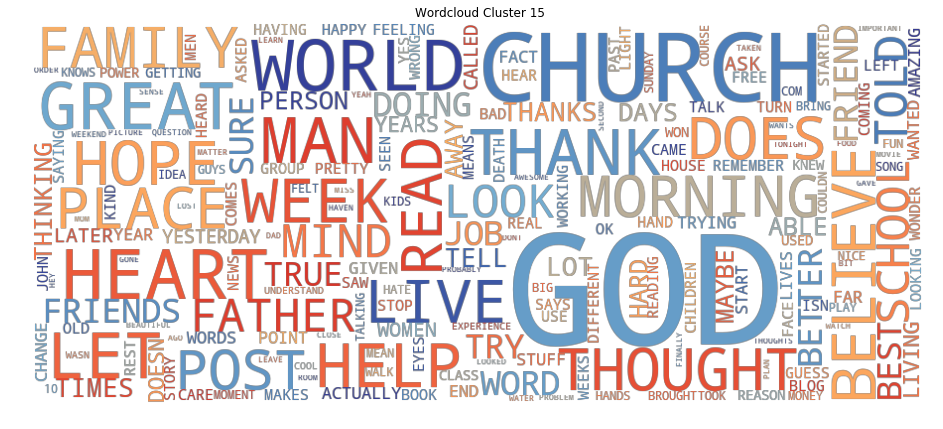

In [50]:
for i, txt in enumerate(list(set(author_data.cluster))):
    plt.figure(figsize=(16,9))
    plt.imshow(wrd_cld_dic_clust(author_data.cluster,i,200), interpolation='bilinear')
    plt.axis("off")
    plt.title("Wordcloud Cluster "+ str(i))


## Significative frequent word by cluster

In [62]:
freq_words_clust=((author_tfidf>0)*1).groupby(author_data.cluster).sum().T

cluster,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
10,568,63,446,62,169,120,376,79,84,155,109,15,63,33,41,61
11,405,42,266,33,126,59,216,58,42,164,72,2,28,13,26,39
12,409,46,268,31,116,74,227,58,48,101,69,5,36,12,24,41
15,405,34,277,38,106,65,188,37,29,91,69,9,38,20,18,35
20,421,30,279,28,96,55,217,42,50,121,77,5,42,24,20,32
2004,220,24,117,12,36,40,208,14,40,121,37,11,25,32,14,20
30,479,52,422,53,161,105,280,72,55,111,90,4,39,22,30,35
able,689,45,422,52,150,126,363,51,69,147,96,10,75,23,51,76
actually,865,122,571,90,251,201,628,104,93,167,181,13,119,23,86,75
ago,678,61,370,49,129,106,327,56,48,134,77,8,66,13,44,54
